# Hospital Readmission
What do we mean by readmission? We mean an admission to the hospital for a patient that is already been hospitalized within a certain period of time.

## 1. Problem Statement

**The goal is to create a model that predicts which patients are at risk for 30-day, 90-day or 365-day unplanned readmission utilizing patients demographics, diagnoses and icustays.**

## 2. Type of model used for prediction
"Re-Admission" is a categorical attribute (YES,NO), so a classification model is used.

## 3. Metrics used for validation
For validation we use the metrics derived from the Confusion Matrix. The structure of this kinf o matrix for a binary classifier is the following:

<img src="images/confusionMatrix.png" alt="confusionMatrix">

There are 4 important terms in this performance:
- True Positives (TP): The cases in which we predicted YES and the actual output was also YES.
- True Negatives (TN): The cases in which we predicted NO and the actual output was NO.
- False Positives (FP): The cases in which we predicted YES and the actual output was NO.
- False Negatives (FN): The cases in which we predicted NO and the actual output was YES.

From these terms we can compute our metrics used for validate the model:
- **Accuracy**: it means how well the models predict all of the labels correctly. **Higher accuracy means better performance**.
<img src="images/accuracy.png" alt="accuracy">
- **Precision**: it describes how well the model can predict the labels correctly.
<img src="images/precision.png" alt="precision">
- **Recall**: it describes how the model can retrieve all of the labels correctly.
<img src="images/recall.png" alt="recall">
- **AUC (Area Under the ROC Curve)**: AUC measures the entire two-dimensional area underneath the entire ROC curve where the ROC curve is a graph showing the performance of a classification model at all classification thresholds, that plots precision and recall. AUC provides an aggregate measure of performance across all possible classification thresholds. One way of interpreting AUC is as the probability that the model ranks a random positive example more highly than a random negative example.
<img src="images/auc.svg" width="350" height="350" alt="auc">

We start importing our baseline dataset extracted selecting only the necessary tables from MIMIC dataset.

In [188]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [189]:
# Import baseline dataset constructed in data extraction and preparation phase
admits_patients_diag = pd.read_csv('admits_patients_diag.csv')

#convert dates
admits_patients_diag.admittime = pd.to_datetime(admits_patients_diag.admittime)
admits_patients_diag.dischtime = pd.to_datetime(admits_patients_diag.dischtime)
admits_patients_diag.deathtime = pd.to_datetime(admits_patients_diag.deathtime)

admits_patients_diag.head()

,Unnamed: 0,subject_id,hadm_id,admittime,dischtime,deathtime,admission_type,insurance,ethnicity,died_at_the_hospital,...,injury,mental,misc,muscular,neoplasms,nervous,pregnancy,prenatal,respiratory,skin
0,0,14679932,21038362,2139-09-26 14:16:00,2139-09-28 11:30:00,NaT,ELECTIVE,Other,OTHER/UNKNOWN,0,...,2,0,0,0,0,0,0,0,0,0
1,1,15585972,24941086,2123-10-07 23:56:00,2123-10-12 11:22:00,NaT,ELECTIVE,Other,WHITE,0,...,2,0,0,0,0,0,0,0,0,0
2,2,15078341,23272159,2122-08-28 08:48:00,2122-08-30 12:32:00,NaT,ELECTIVE,Other,BLACK/AFRICAN AMERICAN,0,...,3,0,0,0,0,0,0,0,0,0
3,3,17301855,29732723,2140-06-06 14:23:00,2140-06-08 14:25:00,NaT,ELECTIVE,Other,WHITE,0,...,2,0,0,0,0,0,0,1,0,0
4,4,17991012,24298836,2181-07-10 20:28:00,2181-07-12 15:49:00,NaT,ELECTIVE,Other,WHITE,0,...,2,0,0,0,0,0,0,0,0,0


In [190]:
# check to see if there are any missing dates
print('Number of missing date admissions:', admits_patients_diag.admittime.isnull().sum())
print('Number of missing date discharges:', admits_patients_diag.dischtime.isnull().sum())

Number of missing date admissions: 0
Number of missing date discharges: 0


Since we want to predict a readmission we have to get the next admission date for a patient if it exists.

In [191]:
# first we sort by subject_id and admission date
admits_patients_diag = admits_patients_diag.sort_values(['subject_id','admittime'])
admits_patients_diag = admits_patients_diag.reset_index(drop = True)

In [192]:
# verify that the previous operation was successful
admits_patients_diag.loc[admits_patients_diag.subject_id == 10000032,['subject_id','admittime','admission_type']]

,subject_id,admittime,admission_type
1,10000032,2180-05-06 22:23:00,EMERGENCY
2,10000032,2180-06-26 18:27:00,EMERGENCY
3,10000032,2180-07-23 12:35:00,EMERGENCY
4,10000032,2180-08-05 23:44:00,EMERGENCY


In [193]:
# add the next admission date and type for each subject using groupby and shift function
admits_patients_diag['next_admittime'] = admits_patients_diag.groupby('subject_id').admittime.shift(-1)
# get the next admission type using groupby and shift function
admits_patients_diag['next_admission_type'] = admits_patients_diag.groupby('subject_id').admission_type.shift(-1)

In [194]:
# verify that the previous operation was successful
admits_patients_diag.loc[admits_patients_diag.subject_id == 10000032,['subject_id','admittime','admission_type','next_admittime','next_admission_type']]

,subject_id,admittime,admission_type,next_admittime,next_admission_type
1,10000032,2180-05-06 22:23:00,EMERGENCY,2180-06-26 18:27:00,EMERGENCY
2,10000032,2180-06-26 18:27:00,EMERGENCY,2180-07-23 12:35:00,EMERGENCY
3,10000032,2180-07-23 12:35:00,EMERGENCY,2180-08-05 23:44:00,EMERGENCY
4,10000032,2180-08-05 23:44:00,EMERGENCY,NaT,NaN


In [195]:
#analyze admission_type
admits_patients_diag['admission_type'].value_counts()

EMERGENCY                      178476
OBSERVATION                     84779
ELECTIVE                        45952
SURGICAL SAME DAY ADMISSION     26171
Name: admission_type, dtype: int64

Since we want to predict UNPLANNED re-admissions, so we should filter out the ELECTIVE (planned) next admissions.

In [196]:
# get rows where next admission is elective and replace with naT or nan
elective_rows = admits_patients_diag.next_admission_type == 'ELECTIVE'
admits_patients_diag.loc[elective_rows,'next_admittime'] = pd.NaT
admits_patients_diag.loc[elective_rows,'next_admission_type'] = np.NaN

In [197]:
# backfill in the values that we removed

# sort by subject_ID and admission date
admits_patients_diag = admits_patients_diag.sort_values(['subject_id','admittime'])

# back fill (this will take a little while)
admits_patients_diag[['next_admittime','next_admission_type']] = admits_patients_diag.groupby(['subject_id'])[['next_admittime','next_admission_type']].fillna(method = 'bfill')

In [198]:
# verify
admits_patients_diag['admission_type'].value_counts()

EMERGENCY                      178476
OBSERVATION                     84779
ELECTIVE                        45952
SURGICAL SAME DAY ADMISSION     26171
Name: admission_type, dtype: int64

In [199]:
admits_patients_diag.head()

,Unnamed: 0,subject_id,hadm_id,admittime,dischtime,deathtime,admission_type,insurance,ethnicity,died_at_the_hospital,...,misc,muscular,neoplasms,nervous,pregnancy,prenatal,respiratory,skin,next_admittime,next_admission_type
0,170509,10000019,25058216,2129-05-21 19:16:00,2129-05-23 18:30:00,NaT,ELECTIVE,Other,WHITE,0,...,0,0,0,0,0,0,0,0,NaT,NaN
1,285967,10000032,22595853,2180-05-06 22:23:00,2180-05-07 17:15:00,NaT,EMERGENCY,Other,WHITE,0,...,1,0,0,0,0,0,1,0,2180-06-26 18:27:00,EMERGENCY
2,285968,10000032,22841357,2180-06-26 18:27:00,2180-06-27 18:49:00,NaT,EMERGENCY,Medicaid,WHITE,0,...,1,0,0,0,0,0,1,0,2180-07-23 12:35:00,EMERGENCY
3,285966,10000032,29079034,2180-07-23 12:35:00,2180-07-25 17:55:00,NaT,EMERGENCY,Medicaid,WHITE,0,...,2,0,0,0,0,0,1,0,2180-08-05 23:44:00,EMERGENCY
4,285969,10000032,25742920,2180-08-05 23:44:00,2180-08-07 17:50:00,NaT,EMERGENCY,Medicaid,WHITE,0,...,2,0,0,0,0,0,1,0,NaT,NaN


Now we calculate days until next admission, because we want to predict unplanned re-admission within a specific range of days (30, 90, 365).

In [200]:
# calculate the number of days between discharge and next admission
admits_patients_diag['days_next_admit']=  (admits_patients_diag.next_admittime - admits_patients_diag.dischtime).dt.total_seconds()/(24*60*60)

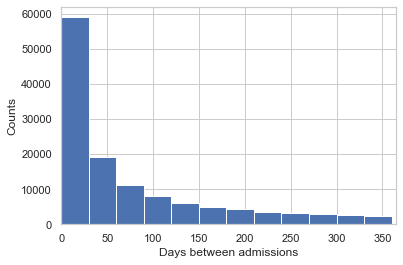

In [201]:
# plot a histogram of days between readmissions if they exist
plt.hist(admits_patients_diag.loc[~admits_patients_diag.days_next_admit.isnull(),'days_next_admit'], bins =range(0,365,30))
plt.xlim([0,365])
plt.xlabel('Days between admissions')
plt.ylabel('Counts')
plt.show()

#### Ethnicity attribute correlation

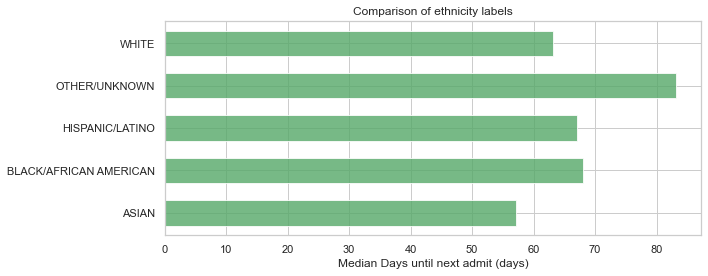

In [202]:
# Re-usable plotting function
def plot_los_groupby(variable, size=(7,4)):
    ''' 
    Plot Median 'Days_Next_Admit" by dataframe categorical series name 
    '''
    results = admits_patients_diag[[variable, 'days_next_admit']].groupby(variable).median().reset_index()
    values = list(results['days_next_admit'].values)
    labels = list(results[variable].values)

    fig, ax = plt.subplots(figsize=size)
    ind = range(len(results))
    ax.barh(ind, values, align='center', height=0.6, color = '#55a868', alpha=0.8)
    ax.set_yticks(ind)
    ax.set_yticklabels(labels)
    ax.set_xlabel('Median Days until next admit (days)')
    ax.tick_params(left=False, top=False, right=False) 
    ax.set_title('Comparison of {} labels'.format(variable))
    
    plt.tight_layout()
    plt.show();

# Look at median "days_next_admit" for groups ETHNICITY
plot_los_groupby('ethnicity', size=(10,4))

To notice that "ASIAN" patients have the lowest median of days until next admission.

#### ADMISSION_TYPE attribute

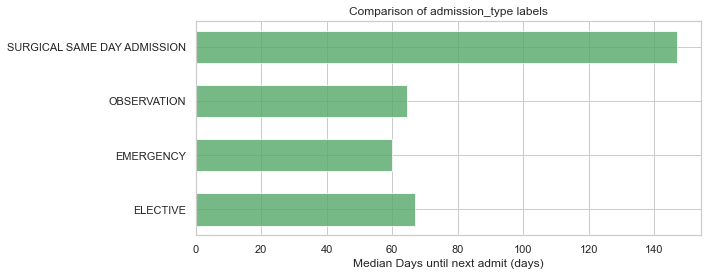

In [203]:
plot_los_groupby('admission_type', size=(10,4))

As we could expect we a larger median of days until next admission for those admission which the patients had a surgical operation in the same day. This is expected because after a surgical operation is probable to be readmitted in a short time of period for observation usually.

### Age attribute


(1.0, 50.0)

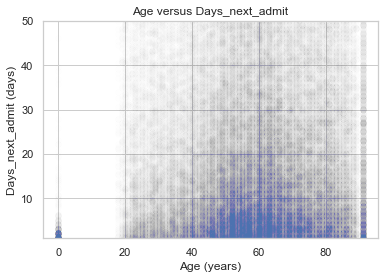

In [204]:
plt.scatter(admits_patients_diag['anchor_age'], admits_patients_diag['days_next_admit'], alpha=0.005)
plt.ylabel('Days_next_admit (days)')
plt.xlabel('Age (years)')
plt.title('Age versus Days_next_admit')
plt.ylim(1, 50)

As we did for our previous tasks, because of the discrete-like distribution of data on the extremes of age, it could be useful to convert all ages into the categories of **newborn, young adult, middle adult, and senior** for use in the prediction model.

In [205]:
age_ranges = [(0, 13), (14, 36), (37, 56), (57, 100)]
for num, cat_range in enumerate(age_ranges):
    admits_patients_diag['anchor_age'] = np.where(admits_patients_diag['anchor_age'].between(cat_range[0],cat_range[1]), num, admits_patients_diag['anchor_age'])

age_dict = {0: 'NEWBORN', 1: 'YOUNG_ADULT', 2: 'MIDDLE_ADULT', 3: 'SENIOR'}
admits_patients_diag['anchor_age'] = admits_patients_diag['anchor_age'].replace(age_dict)
admits_patients_diag.anchor_age.value_counts()

SENIOR          155500
MIDDLE_ADULT     88506
YOUNG_ADULT      52902
NEWBORN          38470
Name: anchor_age, dtype: int64

Now, let's analyze the diagnosis in correlation to the number of day until next admission.

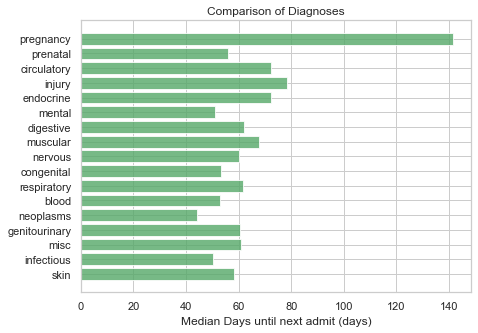

In [206]:
import seaborn as sns

# Look at the median Days_next_Admit by diagnosis category
diag_cat_list = ['skin', 'infectious',  'misc', 'genitourinary', 'neoplasms', 'blood', 'respiratory', 
                  'congenital','nervous', 'muscular', 'digestive', 'mental', 'endocrine', 'injury',
                 'circulatory', 'prenatal',  'pregnancy']

results = []
for variable in diag_cat_list:
    results.append(admits_patients_diag[[variable, 'days_next_admit']].groupby(variable).median().reset_index().values[1][1])

sns.set(style="whitegrid")
fig, ax = plt.subplots(figsize=(7,5))
ind = range(len(results))
ax.barh(ind, results, color = '#55a868', alpha=0.8)
ax.set_yticks(ind)
ax.set_yticklabels(diag_cat_list)
ax.set_xlabel('Median Days until next admit (days)')
ax.tick_params(left=False, right=False, top=False) 
ax.set_title('Comparison of Diagnoses'.format(variable))
plt.show();

We notice that:
- Patients in pregnancy have a really high median, namely the days until next admission are a lot and this is expected because if the birth of the child goes well there is no need for the patient to be readmitted shortly at the hospital.
- Patients diagnosed in the *neoplasms** category, instead, have the lower median. It means that they can more likely be readmitted in a short time. 

The data in the ICUSTAYS table could be useful because indicates if a patient during an admission was in an ICU (Intensive Care Unit). This could be a factor that could increment the possibility that a patient is readmitted to the hospital within a certain period of time.

In [207]:
mimic4_path = '../../mimic-iv-1.0/'

# read icustays table
def read_icustays_table(mimic4_path):
    icustays = pd.read_csv(mimic4_path + 'icu/icustays.csv')
    return icustays

icustays = read_icustays_table(mimic4_path)
icustays.head()

,subject_id,hadm_id,stay_id,first_careunit,last_careunit,intime,outtime,los
0,17867402,24528534,31793211,Trauma SICU (TSICU),Trauma SICU (TSICU),2154-03-03 04:11:00,2154-03-04 18:16:56,1.587454
1,14435996,28960964,31983544,Trauma SICU (TSICU),Trauma SICU (TSICU),2150-06-19 17:57:00,2150-06-22 18:33:54,3.025625
2,17609946,27385897,33183475,Trauma SICU (TSICU),Trauma SICU (TSICU),2138-02-05 18:54:00,2138-02-15 12:42:05,9.741725
3,18966770,23483021,34131444,Trauma SICU (TSICU),Trauma SICU (TSICU),2123-10-25 10:35:00,2123-10-25 18:59:47,0.350544
4,12776735,20817525,34547665,Neuro Stepdown,Neuro Stepdown,2200-07-12 00:33:00,2200-07-13 16:44:40,1.674769


In [208]:
icustays['category'] = icustays['first_careunit']
icu_list = icustays.groupby('hadm_id')['category'].apply(list).reset_index()
icu_list.head()

,hadm_id,category
0,20000094,[Coronary Care Unit (CCU)]
1,20000147,[Coronary Care Unit (CCU)]
2,20000351,[Medical/Surgical Intensive Care Unit (MICU/SI...
3,20000397,[Coronary Care Unit (CCU)]
4,20000808,"[Surgical Intensive Care Unit (SICU), Surgical..."


In [209]:
icustays['first_careunit'].value_counts()

Medical Intensive Care Unit (MICU)                  16729
Medical/Surgical Intensive Care Unit (MICU/SICU)    13421
Cardiac Vascular Intensive Care Unit (CVICU)        12169
Surgical Intensive Care Unit (SICU)                 11765
Trauma SICU (TSICU)                                  9165
Coronary Care Unit (CCU)                             8746
Neuro Surgical Intensive Care Unit (Neuro SICU)      1851
Neuro Intermediate                                   1823
Neuro Stepdown                                        871
Name: first_careunit, dtype: int64

In [210]:
# Create admission-ICU matrix
icu_item = pd.get_dummies(icu_list['category'].apply(pd.Series).stack()).sum(level=0)
icu_item[icu_item >= 1] = 1
icu_item = icu_item.join(icu_list['hadm_id'], how="outer")
icu_item.head()

,Cardiac Vascular Intensive Care Unit (CVICU),Coronary Care Unit (CCU),Medical Intensive Care Unit (MICU),Medical/Surgical Intensive Care Unit (MICU/SICU),Neuro Intermediate,Neuro Stepdown,Neuro Surgical Intensive Care Unit (Neuro SICU),Surgical Intensive Care Unit (SICU),Trauma SICU (TSICU),hadm_id
0,0,1,0,0,0,0,0,0,0,20000094
1,0,1,0,0,0,0,0,0,0,20000147
2,0,0,0,1,0,0,0,0,0,20000351
3,0,1,0,0,0,0,0,0,0,20000397
4,0,0,0,0,0,0,0,1,0,20000808


In [211]:
# Merge ICU data with main dataFrame
final_df = admits_patients_diag.merge(icu_item, how='outer', on='hadm_id')
final_df.head()

,Unnamed: 0,subject_id,hadm_id,admittime,dischtime,deathtime,admission_type,insurance,ethnicity,died_at_the_hospital,...,days_next_admit,Cardiac Vascular Intensive Care Unit (CVICU),Coronary Care Unit (CCU),Medical Intensive Care Unit (MICU),Medical/Surgical Intensive Care Unit (MICU/SICU),Neuro Intermediate,Neuro Stepdown,Neuro Surgical Intensive Care Unit (Neuro SICU),Surgical Intensive Care Unit (SICU),Trauma SICU (TSICU)
0,170509.0,10000019.0,25058216,2129-05-21 19:16:00,2129-05-23 18:30:00,NaT,ELECTIVE,Other,WHITE,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,285967.0,10000032.0,22595853,2180-05-06 22:23:00,2180-05-07 17:15:00,NaT,EMERGENCY,Other,WHITE,0.0,...,50.050000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,285968.0,10000032.0,22841357,2180-06-26 18:27:00,2180-06-27 18:49:00,NaT,EMERGENCY,Medicaid,WHITE,0.0,...,25.740278,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,285966.0,10000032.0,29079034,2180-07-23 12:35:00,2180-07-25 17:55:00,NaT,EMERGENCY,Medicaid,WHITE,0.0,...,11.242361,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,285969.0,10000032.0,25742920,2180-08-05 23:44:00,2180-08-07 17:50:00,NaT,EMERGENCY,Medicaid,WHITE,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [212]:
# Replace NaNs with 0
final_df['Cardiac Vascular Intensive Care Unit (CVICU)'].fillna(value=0, inplace=True)
final_df['Coronary Care Unit (CCU)'].fillna(value=0, inplace=True)
final_df['Medical Intensive Care Unit (MICU)'].fillna(value=0, inplace=True)
final_df['Medical/Surgical Intensive Care Unit (MICU/SICU)'].fillna(value=0, inplace=True)
final_df['Neuro Intermediate'].fillna(value=0, inplace=True)
final_df['Neuro Stepdown'].fillna(value=0, inplace=True)
final_df['Neuro Surgical Intensive Care Unit (Neuro SICU)'].fillna(value=0, inplace=True)
final_df['Surgical Intensive Care Unit (SICU)'].fillna(value=0, inplace=True)
final_df['Trauma SICU (TSICU)'].fillna(value=0, inplace=True)

In [213]:
final_df.head()

,Unnamed: 0,subject_id,hadm_id,admittime,dischtime,deathtime,admission_type,insurance,ethnicity,died_at_the_hospital,...,days_next_admit,Cardiac Vascular Intensive Care Unit (CVICU),Coronary Care Unit (CCU),Medical Intensive Care Unit (MICU),Medical/Surgical Intensive Care Unit (MICU/SICU),Neuro Intermediate,Neuro Stepdown,Neuro Surgical Intensive Care Unit (Neuro SICU),Surgical Intensive Care Unit (SICU),Trauma SICU (TSICU)
0,170509.0,10000019.0,25058216,2129-05-21 19:16:00,2129-05-23 18:30:00,NaT,ELECTIVE,Other,WHITE,0.0,...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,285967.0,10000032.0,22595853,2180-05-06 22:23:00,2180-05-07 17:15:00,NaT,EMERGENCY,Other,WHITE,0.0,...,50.050000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,285968.0,10000032.0,22841357,2180-06-26 18:27:00,2180-06-27 18:49:00,NaT,EMERGENCY,Medicaid,WHITE,0.0,...,25.740278,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,285966.0,10000032.0,29079034,2180-07-23 12:35:00,2180-07-25 17:55:00,NaT,EMERGENCY,Medicaid,WHITE,0.0,...,11.242361,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,285969.0,10000032.0,25742920,2180-08-05 23:44:00,2180-08-07 17:50:00,NaT,EMERGENCY,Medicaid,WHITE,0.0,...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## 5. Data cleaning

In [214]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 363071 entries, 0 to 363070
Data columns (total 42 columns):
 #   Column                                            Non-Null Count   Dtype         
---  ------                                            --------------   -----         
 0   Unnamed: 0                                        335378 non-null  float64       
 1   subject_id                                        335378 non-null  float64       
 2   hadm_id                                           363071 non-null  int64         
 3   admittime                                         335378 non-null  datetime64[ns]
 4   dischtime                                         335378 non-null  datetime64[ns]
 5   deathtime                                         5670 non-null    datetime64[ns]
 6   admission_type                                    335378 non-null  object        
 7   insurance                                         335378 non-null  object        
 8   ethnicity     

In [215]:
# Remove deceased persons because for for sure they will not be readmitted again
final_df = final_df[final_df['died_at_the_hospital'] == 0.0]
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 329708 entries, 0 to 335377
Data columns (total 42 columns):
 #   Column                                            Non-Null Count   Dtype         
---  ------                                            --------------   -----         
 0   Unnamed: 0                                        329708 non-null  float64       
 1   subject_id                                        329708 non-null  float64       
 2   hadm_id                                           329708 non-null  int64         
 3   admittime                                         329708 non-null  datetime64[ns]
 4   dischtime                                         329708 non-null  datetime64[ns]
 5   deathtime                                         0 non-null       datetime64[ns]
 6   admission_type                                    329708 non-null  object        
 7   insurance                                         329708 non-null  object        
 8   ethnicity     

In [216]:
# Drop unused or no longer needed columns
final_df.drop(columns=['Unnamed: 0', 'subject_id', 'hadm_id', 'admittime', 'dischtime', 'deathtime','dod', 'died_at_the_hospital'], inplace=True)

final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 329708 entries, 0 to 335377
Data columns (total 34 columns):
 #   Column                                            Non-Null Count   Dtype         
---  ------                                            --------------   -----         
 0   admission_type                                    329708 non-null  object        
 1   insurance                                         329708 non-null  object        
 2   ethnicity                                         329708 non-null  object        
 3   gender                                            329708 non-null  object        
 4   anchor_age                                        329708 non-null  object        
 5   blood                                             329708 non-null  float64       
 6   circulatory                                       329708 non-null  float64       
 7   congenital                                        329708 non-null  float64       
 8   digestive     

In [217]:
final_df.head()

,admission_type,insurance,ethnicity,gender,anchor_age,blood,circulatory,congenital,digestive,endocrine,...,days_next_admit,Cardiac Vascular Intensive Care Unit (CVICU),Coronary Care Unit (CCU),Medical Intensive Care Unit (MICU),Medical/Surgical Intensive Care Unit (MICU/SICU),Neuro Intermediate,Neuro Stepdown,Neuro Surgical Intensive Care Unit (Neuro SICU),Surgical Intensive Care Unit (SICU),Trauma SICU (TSICU)
0,ELECTIVE,Other,WHITE,M,NEWBORN,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,EMERGENCY,Other,WHITE,F,MIDDLE_ADULT,0.0,0.0,0.0,2.0,0.0,...,50.050000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,EMERGENCY,Medicaid,WHITE,F,MIDDLE_ADULT,1.0,0.0,0.0,1.0,1.0,...,25.740278,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,EMERGENCY,Medicaid,WHITE,F,MIDDLE_ADULT,0.0,1.0,0.0,1.0,2.0,...,11.242361,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,EMERGENCY,Medicaid,WHITE,F,MIDDLE_ADULT,0.0,0.0,0.0,1.0,2.0,...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [218]:
# Convert gender into numeric boolean attribute
final_df['gender'].replace({'M': 0, 'F':1}, inplace=True)
final_df.head()

,admission_type,insurance,ethnicity,gender,anchor_age,blood,circulatory,congenital,digestive,endocrine,...,days_next_admit,Cardiac Vascular Intensive Care Unit (CVICU),Coronary Care Unit (CCU),Medical Intensive Care Unit (MICU),Medical/Surgical Intensive Care Unit (MICU/SICU),Neuro Intermediate,Neuro Stepdown,Neuro Surgical Intensive Care Unit (Neuro SICU),Surgical Intensive Care Unit (SICU),Trauma SICU (TSICU)
0,ELECTIVE,Other,WHITE,0,NEWBORN,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,EMERGENCY,Other,WHITE,1,MIDDLE_ADULT,0.0,0.0,0.0,2.0,0.0,...,50.050000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,EMERGENCY,Medicaid,WHITE,1,MIDDLE_ADULT,1.0,0.0,0.0,1.0,1.0,...,25.740278,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,EMERGENCY,Medicaid,WHITE,1,MIDDLE_ADULT,0.0,1.0,0.0,1.0,2.0,...,11.242361,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,EMERGENCY,Medicaid,WHITE,1,MIDDLE_ADULT,0.0,0.0,0.0,1.0,2.0,...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [219]:
# Create dummy columns for categorical variables
prefix_cols = ['ADM', 'INS', 'ETH', 'AGE']
dummy_cols = ['admission_type', 'insurance','ethnicity', 'anchor_age']
final_df = pd.get_dummies(final_df, prefix=prefix_cols, columns=dummy_cols)
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 329708 entries, 0 to 335377
Data columns (total 46 columns):
 #   Column                                            Non-Null Count   Dtype         
---  ------                                            --------------   -----         
 0   gender                                            329708 non-null  int64         
 1   blood                                             329708 non-null  float64       
 2   circulatory                                       329708 non-null  float64       
 3   congenital                                        329708 non-null  float64       
 4   digestive                                         329708 non-null  float64       
 5   endocrine                                         329708 non-null  float64       
 6   genitourinary                                     329708 non-null  float64       
 7   infectious                                        329708 non-null  float64       
 8   injury        

In [220]:
# Check for any remaining NaNs
final_df.isnull().sum()

gender                                                   0
blood                                                    0
circulatory                                              0
congenital                                               0
digestive                                                0
endocrine                                                0
genitourinary                                            0
infectious                                               0
injury                                                   0
mental                                                   0
misc                                                     0
muscular                                                 0
neoplasms                                                0
nervous                                                  0
pregnancy                                                0
prenatal                                                 0
respiratory                                             

In [221]:
# Drop rows that contain NaN values
final_df.dropna(axis=0, inplace=True)

In [222]:
# Check for any remaining NaNs
final_df.isnull().values.sum()

0

In [223]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 160543 entries, 1 to 335375
Data columns (total 46 columns):
 #   Column                                            Non-Null Count   Dtype         
---  ------                                            --------------   -----         
 0   gender                                            160543 non-null  int64         
 1   blood                                             160543 non-null  float64       
 2   circulatory                                       160543 non-null  float64       
 3   congenital                                        160543 non-null  float64       
 4   digestive                                         160543 non-null  float64       
 5   endocrine                                         160543 non-null  float64       
 6   genitourinary                                     160543 non-null  float64       
 7   infectious                                        160543 non-null  float64       
 8   injury        

### Compute the OUTPUT LABELs to predict


In [224]:
final_df['READMISSION_30'] = (final_df.days_next_admit < 30).astype('int')
final_df['READMISSION_90'] = (final_df.days_next_admit < 90).astype('int')
final_df['READMISSION_365'] = (final_df.days_next_admit < 365).astype('int')

In [225]:
# READMISSION_30 rates
print('Number of positive samples:', (final_df.READMISSION_30 == 1).sum())
print('Number of negative samples:',  (final_df.READMISSION_30 == 0).sum())
print('Total samples:', len(final_df))

Number of positive samples: 58980
Number of negative samples: 101563
Total samples: 160543


In [226]:
# READMISSION_90 rates
print('Number of positive samples:', (final_df.READMISSION_90 == 1).sum())
print('Number of negative samples:',  (final_df.READMISSION_90 == 0).sum())
print('Total samples:', len(final_df))

Number of positive samples: 89167
Number of negative samples: 71376
Total samples: 160543


In [227]:
# READMISSION_365 rates
print('Number of positive samples:', (final_df.READMISSION_365 == 1).sum())
print('Number of negative samples:',  (final_df.READMISSION_365 == 0).sum())
print('Total samples:', len(final_df))

Number of positive samples: 127181
Number of negative samples: 33362
Total samples: 160543


In [228]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 160543 entries, 1 to 335375
Data columns (total 49 columns):
 #   Column                                            Non-Null Count   Dtype         
---  ------                                            --------------   -----         
 0   gender                                            160543 non-null  int64         
 1   blood                                             160543 non-null  float64       
 2   circulatory                                       160543 non-null  float64       
 3   congenital                                        160543 non-null  float64       
 4   digestive                                         160543 non-null  float64       
 5   endocrine                                         160543 non-null  float64       
 6   genitourinary                                     160543 non-null  float64       
 7   infectious                                        160543 non-null  float64       
 8   injury        

In [229]:
# Drop no longer needed columns
final_df.drop(columns=['next_admittime', 'next_admission_type', 'days_next_admit'], inplace=True)

final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 160543 entries, 1 to 335375
Data columns (total 46 columns):
 #   Column                                            Non-Null Count   Dtype  
---  ------                                            --------------   -----  
 0   gender                                            160543 non-null  int64  
 1   blood                                             160543 non-null  float64
 2   circulatory                                       160543 non-null  float64
 3   congenital                                        160543 non-null  float64
 4   digestive                                         160543 non-null  float64
 5   endocrine                                         160543 non-null  float64
 6   genitourinary                                     160543 non-null  float64
 7   infectious                                        160543 non-null  float64
 8   injury                                            160543 non-null  float64
 9   ment

In [230]:
df_cleaned = final_df.astype(int)

The final DataFrame size resulted in 43 feature columns and 1 target column (READMISSION_30) or (READMISSION_90) or (READMISSION_365) alternatively with an entry count of 160543.

## 6. Prediction Model

We use a **Supervised Learning ML model**. First of all what is it?
Supervised learning is defined by its use of labeled datasets to train algorithms that to classify data or predict outcomes accurately. It uses a training set to teach models to yield the desired output. This training dataset includes inputs and correct outputs, which allow the model to learn over time. The algorithm measures its accuracy through the loss function, adjusting until the error has been sufficiently minimized. 

**Why do we choose it?** Because in our case we have the corret output for each dataset entry: "READMISSION_30" (Yes or No - 1 or 0) and we want to create a model that predicts this output for new entries, in other words that it "generalize well".

We will implement the supervised learning prediction model using the **Scikit-Learn** machine learning library.

To implement the prediction model, our dataset is splitted into training and test sets at an 80:20 ratio using the scikit-learn *train_test_split* function.

**Why split in training and test set?** Because to detect a machine learning model behavior, we need to use observations that aren’t used in the training process. Otherwise, the evaluation of the model would be biased as a matter of fact when we build a predictive model, we want the model to work well on data that the model has never seen, so that's the reason why we use a training set to train the model and a test set to evaulate the model accuaracy.

Searching on the Internet for the best train-test ratio, the first answer is 80:20. This means we use 80% of the observations for training and the rest for testing. This approach is taken in this case.
zability)


In [231]:
# Target Variable READMISSION_30
READMISSION_30 = df_cleaned['READMISSION_30'].values
# Prediction Features
features = df_cleaned.drop(columns=['READMISSION_30', 'READMISSION_90', 'READMISSION_365'])

In [232]:
from sklearn.model_selection import train_test_split

# Split into training set 80% and test set 20%
X_train, X_test, y_train, y_test = train_test_split(features, 
                                                    READMISSION_30, 
                                                    test_size = .20, 
                                                    random_state = 0)

# Show the results of the split
print("Training set has {} samples.".format(X_train.shape[0]))
print("Testing set has {} samples.".format(X_test.shape[0]))

Training set has 128434 samples.
Testing set has 32109 samples.


In [233]:
from sklearn.linear_model import LogisticRegression

# We'll use a simple classifier for this task
clf=LogisticRegression(C = 0.0001, penalty = 'l2', random_state = 42)
clf.fit(X_train, y_train)

LogisticRegression(C=0.0001, random_state=42)

Logistic regression, despite its name, is a linear model for classification rather than regression. In this model, the probabilities describing the possible outcomes of a single trial are modeled using a logistic function.

In [234]:
# Calculate probability of re-admission within 30 days
model = clf
y_train_preds = model.predict_proba(X_train)[:,1]
y_test_preds = model.predict_proba(X_test)[:,1]

In [235]:
print(y_train[:10])
print(y_train_preds[:10])

[1 1 0 0 0 1 0 0 0 0]
[0.48290955 0.40408915 0.30761995 0.33062243 0.39206664 0.31875484
 0.38196265 0.29467634 0.2974451  0.40647122]


## 7. Model Evalutaion & Parameter Tuning

### Calculate Performance metrics

In [236]:
def calc_accuracy(y_actual, y_pred, thresh):
    # this function calculates the accuracy with probability threshold at thresh
    return (sum((y_pred > thresh) & (y_actual == 1))+sum((y_pred < thresh) & (y_actual == 0))) /len(y_actual)

def calc_recall(y_actual, y_pred, thresh):
    # calculates the recall
    return sum((y_pred > thresh) & (y_actual == 1)) /sum(y_actual)

def calc_precision(y_actual, y_pred, thresh):
    # calculates the precision
    return sum((y_pred > thresh) & (y_actual == 1)) /sum(y_pred > thresh)

Train AUC:0.605
Test AUC:0.605
Train accuracy:0.636
Test accuracy:0.630
Train recall:0.048
Test recall:0.043
Train precision:0.537
Test precision:0.522


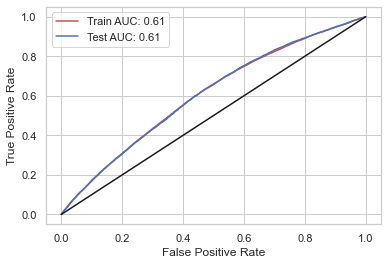

In [237]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_preds)
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_preds)


thresh = 0.5

auc_train = roc_auc_score(y_train, y_train_preds)
auc_test = roc_auc_score(y_test, y_test_preds)

print('Train AUC:%.3f'%auc_train)
print('Test AUC:%.3f'%auc_test)

print('Train accuracy:%.3f'%calc_accuracy(y_train, y_train_preds, thresh))
print('Test accuracy:%.3f'%calc_accuracy(y_test, y_test_preds, thresh))

print('Train recall:%.3f'%calc_recall(y_train, y_train_preds, thresh))
print('Test recall:%.3f'%calc_recall(y_test, y_test_preds, thresh))

print('Train precision:%.3f'%calc_precision(y_train, y_train_preds, thresh))
print('Test precision:%.3f'%calc_precision(y_test, y_test_preds, thresh))

plt.plot(fpr_train, tpr_train,'r-', label = 'Train AUC: %.2f'%auc_train)
plt.plot(fpr_test, tpr_test,'b-',label = 'Test AUC: %.2f'%auc_test)
plt.plot([0,1],[0,1],'-k')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

### Parameter Tuning

All decisions will have a trade-off on the metrics described above. Let's choose AUC for this task as it balances FPR and TPR.

In [238]:
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit


def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5)):
    """
    Generate a simple plot of the test and training learning curve.

    Parameters
    ----------
    estimator : object type that implements the "fit" and "predict" methods
        An object of that type which is cloned for each validation.

    title : string
        Title for the chart.

    X : array-like, shape (n_samples, n_features)
        Training vector, where n_samples is the number of samples and
        n_features is the number of features.

    y : array-like, shape (n_samples) or (n_samples, n_features), optional
        Target relative to X for classification or regression;
        None for unsupervised learning.

    ylim : tuple, shape (ymin, ymax), optional
        Defines minimum and maximum yvalues plotted.

    cv : int, cross-validation generator or an iterable, optional
        Determines the cross-validation splitting strategy.
        Possible inputs for cv are:
          - None, to use the default 3-fold cross-validation,
          - integer, to specify the number of folds.
          - An object to be used as a cross-validation generator.
          - An iterable yielding train/test splits.

        For integer/None inputs, if ``y`` is binary or multiclass,
        :class:`StratifiedKFold` used. If the estimator is not a classifier
        or if ``y`` is neither binary nor multiclass, :class:`KFold` is used.

        Refer :ref:`User Guide <cross_validation>` for the various
        cross-validators that can be used here.

    n_jobs : integer, optional
        Number of jobs to run in parallel (default 1).
    """
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("AUC")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring = 'roc_auc')
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="b")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="b",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

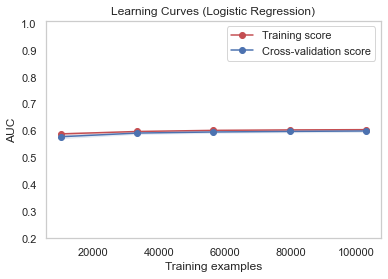

In [239]:
title = "Learning Curves (Logistic Regression)"
# Cross validation with 5 iterations to get smoother mean test and train
# score curves, each time with 20% data randomly selected as a validation set.
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=42)
estimator = LogisticRegression( C = 0.0001, penalty = 'l2')
plot_learning_curve(estimator, title, X_train, y_train, ylim=(0.2, 1.01), cv=cv, n_jobs=4)

plt.show()

In [240]:
# let's try and visualize different hypermparamters

Cs = [0.00001, 0.00003, 0.0001, 0.0003, 0.001, 0.003]
train_aucs = np.zeros(len(Cs))
test_aucs = np.zeros(len(Cs))

for ii in range(len(Cs)):
    C = Cs[ii]
    print('\n C:', C)
    
    # logistic regression
    
    clf=LogisticRegression(C = C, penalty = 'l2', random_state = 42)
    clf.fit(X_train, y_train)

    model = clf
    y_train_preds = model.predict_proba(X_train)[:,1]
    y_test_preds = model.predict_proba(X_test)[:,1]

    auc_train = roc_auc_score(y_train, y_train_preds)
    auc_test = roc_auc_score(y_test, y_test_preds)
    print('Train AUC:%.3f'%auc_train)
    print('Test AUC:%.3f'%auc_test)
    train_aucs[ii] = auc_train
    test_aucs[ii] = auc_test


 C: 1e-05
Train AUC:0.587
Test AUC:0.589

 C: 3e-05
Train AUC:0.597
Test AUC:0.598

 C: 0.0001
Train AUC:0.605
Test AUC:0.605

 C: 0.0003
Train AUC:0.609
Test AUC:0.609

 C: 0.001
Train AUC:0.612
Test AUC:0.613

 C: 0.003
Train AUC:0.614
Test AUC:0.615


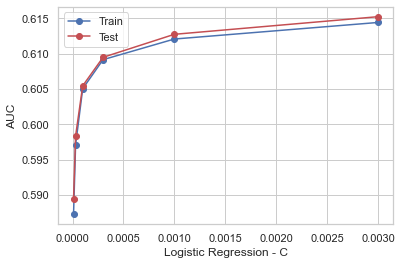

In [241]:

plt.plot(Cs, train_aucs,'bo-', label ='Train')
plt.plot(Cs, test_aucs, 'ro-', label='Test')
plt.legend()
plt.xlabel('Logistic Regression - C')
plt.ylabel('AUC')
plt.show()

Let's execute againg the prediction with the tuned hyperparamter of LogisticRegression C =0.003 that maximize our performance metric AUC curve.

In [242]:
from sklearn.linear_model import LogisticRegression

# Logistic regression with tuned paramter C = 0.003
clf=LogisticRegression(C = 0.003, penalty = 'l2', random_state = 42)
clf.fit(X_train, y_train)


LogisticRegression(C=0.003, random_state=42)

In [244]:
# Calculate probability of re-admission within 30 days
model = clf
y_train_preds = model.predict_proba(X_train)[:,1]
y_test_preds = model.predict_proba(X_test)[:,1]
print(y_train[:10])
print(y_train_preds[:10])

[1 1 0 0 0 1 0 0 0 0]
[0.51703183 0.45155691 0.31220777 0.35475367 0.39630306 0.29985046
 0.40903701 0.27001664 0.25939752 0.44125596]


Train AUC:0.614
Test AUC:0.615
Train accuracy:0.637
Test accuracy:0.633
Train recall:0.103
Test recall:0.101
Train precision:0.527
Test precision:0.531


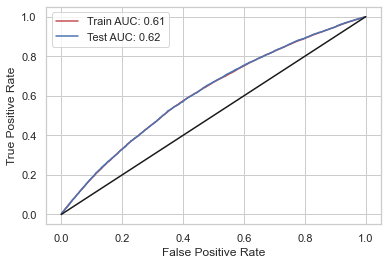

In [245]:
# recalculate the performance metrics
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_preds)
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_preds)


thresh = 0.5

auc_train = roc_auc_score(y_train, y_train_preds)
auc_test = roc_auc_score(y_test, y_test_preds)

print('Train AUC:%.3f'%auc_train)
print('Test AUC:%.3f'%auc_test)

print('Train accuracy:%.3f'%calc_accuracy(y_train, y_train_preds, thresh))
print('Test accuracy:%.3f'%calc_accuracy(y_test, y_test_preds, thresh))

print('Train recall:%.3f'%calc_recall(y_train, y_train_preds, thresh))
print('Test recall:%.3f'%calc_recall(y_test, y_test_preds, thresh))

print('Train precision:%.3f'%calc_precision(y_train, y_train_preds, thresh))
print('Test precision:%.3f'%calc_precision(y_test, y_test_preds, thresh))

plt.plot(fpr_train, tpr_train,'r-', label = 'Train AUC: %.2f'%auc_train)
plt.plot(fpr_test, tpr_test,'b-',label = 'Test AUC: %.2f'%auc_test)
plt.plot([0,1],[0,1],'-k')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

We can see that we tuned parameters, the AUC score is improved.

## 8. Result Discussion

In the previous section we already saw the perfomrance metrics of the model. Now let's try to see what features were most important in predicting 30 days hospital readmission when using the logistic regression classifier model.

In [247]:
clf=LogisticRegression(C = 0.003, penalty = 'l2', random_state = 42)
clf.fit(X_train, y_train)
model = clf

Feature: 0, Score: -0.12856
Feature: 1, Score: 0.10846
Feature: 2, Score: 0.00975
Feature: 3, Score: 0.04628
Feature: 4, Score: 0.07533
Feature: 5, Score: -0.00587
Feature: 6, Score: 0.04073
Feature: 7, Score: 0.06821
Feature: 8, Score: 0.05410
Feature: 9, Score: 0.13245
Feature: 10, Score: -0.00732
Feature: 11, Score: -0.07943
Feature: 12, Score: 0.21556
Feature: 13, Score: -0.01840
Feature: 14, Score: -0.09642
Feature: 15, Score: 0.03879
Feature: 16, Score: 0.01127
Feature: 17, Score: -0.00156
Feature: 18, Score: 0.24049
Feature: 19, Score: 0.13414
Feature: 20, Score: 0.04057
Feature: 21, Score: 0.02513
Feature: 22, Score: 0.00000
Feature: 23, Score: 0.00000
Feature: 24, Score: 0.00000
Feature: 25, Score: 0.17311
Feature: 26, Score: 0.12955
Feature: 27, Score: -0.01309
Feature: 28, Score: 0.01255
Feature: 29, Score: 0.21770
Feature: 30, Score: -0.21508
Feature: 31, Score: 0.02207
Feature: 32, Score: -0.01630
Feature: 33, Score: -0.00370
Feature: 34, Score: 0.12936
Feature: 35, Score:

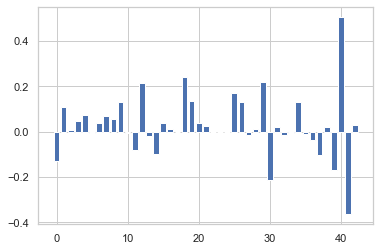

In [248]:
from matplotlib import pyplot

# get importance
importance = model.coef_[0]
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

In [249]:
# Feature 40 was the most important in prediction
print(features.columns[40])

AGE_NEWBORN


**30 DAYS-READMISSION result**: the result from our study is that "Newborn patients" are more likely to be readmitted after 30 days from last discarge from hospital. This could be expected for newborn patients due to usual observatory purposes.

### Readmission_90 , Readmission_365

Now we do the same prediction with "LogisticRegression" and with the same paramters, but now we want to predict readmission to the hospital within 90 and 365 days from the last discharge.

In [250]:
df_cleaned.head()

,gender,blood,circulatory,congenital,digestive,endocrine,genitourinary,infectious,injury,mental,...,ETH_HISPANIC/LATINO,ETH_OTHER/UNKNOWN,ETH_WHITE,AGE_MIDDLE_ADULT,AGE_NEWBORN,AGE_SENIOR,AGE_YOUNG_ADULT,READMISSION_30,READMISSION_90,READMISSION_365
1,1,0,0,0,2,0,0,1,1,2,...,0,0,1,1,0,0,0,0,1,1
2,1,1,0,0,1,1,0,1,1,1,...,0,0,1,1,0,0,0,1,1,1
3,1,0,1,0,1,2,0,1,3,2,...,0,0,1,1,0,0,0,1,1,1
17,1,0,0,0,0,0,0,0,1,0,...,0,0,1,0,1,0,0,1,1,1
22,1,1,0,0,4,3,1,0,0,2,...,0,0,1,0,0,0,1,1,1,1


In [251]:
# Target Variable READMISSION_90
READMISSION_90 = df_cleaned['READMISSION_90'].values
# Prediction Features
features = df_cleaned.drop(columns=['READMISSION_90', 'READMISSION_30', 'READMISSION_365'])

In [252]:
from sklearn.model_selection import train_test_split

# Split into training set 80% and test set 20%
X_train, X_test, y_train, y_test = train_test_split(features, 
                                                    READMISSION_90, 
                                                    test_size = .20, 
                                                    random_state = 0)

# Show the results of the split
print("Training set has {} samples.".format(X_train.shape[0]))
print("Testing set has {} samples.".format(X_test.shape[0]))

Training set has 128434 samples.
Testing set has 32109 samples.


In [253]:
clf=LogisticRegression(C = 0.003, penalty = 'l2', random_state = 42)
clf.fit(X_train, y_train)

LogisticRegression(C=0.003, random_state=42)

In [255]:
# calculate probabilities
model = clf
y_train_preds = model.predict_proba(X_train)[:,1]
y_test_preds = model.predict_proba(X_test)[:,1]
print(y_train[:10])
print(y_train_preds[:10])

[1 1 1 1 0 1 0 0 1 0]
[0.77487392 0.60949116 0.46756107 0.48497073 0.63474014 0.44503751
 0.59959792 0.46913974 0.52507816 0.67952589]


Train AUC:0.637
Test AUC:0.642
Train accuracy:0.611
Test accuracy:0.615
Train recall:0.759
Test recall:0.761
Train precision:0.623
Test precision:0.627


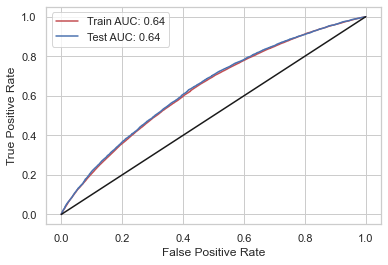

In [256]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_preds)
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_preds)


thresh = 0.5

auc_train = roc_auc_score(y_train, y_train_preds)
auc_test = roc_auc_score(y_test, y_test_preds)

print('Train AUC:%.3f'%auc_train)
print('Test AUC:%.3f'%auc_test)

print('Train accuracy:%.3f'%calc_accuracy(y_train, y_train_preds, thresh))
print('Test accuracy:%.3f'%calc_accuracy(y_test, y_test_preds, thresh))

print('Train recall:%.3f'%calc_recall(y_train, y_train_preds, thresh))
print('Test recall:%.3f'%calc_recall(y_test, y_test_preds, thresh))

print('Train precision:%.3f'%calc_precision(y_train, y_train_preds, thresh))
print('Test precision:%.3f'%calc_precision(y_test, y_test_preds, thresh))

plt.plot(fpr_train, tpr_train,'r-', label = 'Train AUC: %.2f'%auc_train)
plt.plot(fpr_test, tpr_test,'b-',label = 'Test AUC: %.2f'%auc_test)
plt.plot([0,1],[0,1],'-k')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

Feature: 0, Score: -0.14218
Feature: 1, Score: 0.12667
Feature: 2, Score: 0.03341
Feature: 3, Score: 0.08523
Feature: 4, Score: 0.11130
Feature: 5, Score: -0.00028
Feature: 6, Score: 0.05741
Feature: 7, Score: 0.10620
Feature: 8, Score: 0.06917
Feature: 9, Score: 0.15032
Feature: 10, Score: 0.01086
Feature: 11, Score: -0.06523
Feature: 12, Score: 0.31814
Feature: 13, Score: 0.02175
Feature: 14, Score: -0.12024
Feature: 15, Score: 0.02338
Feature: 16, Score: 0.02614
Feature: 17, Score: 0.04280
Feature: 18, Score: 0.13522
Feature: 19, Score: 0.08605
Feature: 20, Score: 0.00360
Feature: 21, Score: 0.03133
Feature: 22, Score: 0.00000
Feature: 23, Score: 0.00000
Feature: 24, Score: 0.00000
Feature: 25, Score: 0.14205
Feature: 26, Score: 0.06981
Feature: 27, Score: -0.04164
Feature: 28, Score: 0.08315
Feature: 29, Score: 0.25358
Feature: 30, Score: -0.29666
Feature: 31, Score: 0.03469
Feature: 32, Score: 0.01240
Feature: 33, Score: -0.04866
Feature: 34, Score: 0.09251
Feature: 35, Score: 0.0

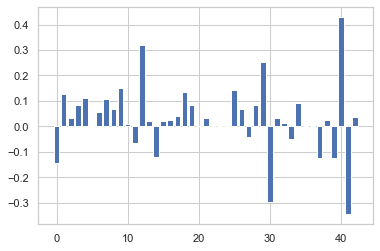

In [257]:
from matplotlib import pyplot

# get importance
importance = model.coef_[0]
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

In [264]:
print(features.columns[40])
print(features.columns[12])

AGE_NEWBORN
neoplasms


**90 DAYS-READMISSION result**: the result is similar from 30-DAYS-READMISSION so also in this case "Newborn patients" are more likely to be readmitted after 90 days from last discarge from hospital. But we can see how also the feature "neoplasm" has an importance pretty high in prediction. This means that, in addition to "newborn patients", also patients diagnosed in the category "neoplasm" are more likely to be readmitted to the hospital after 90 days from discharge.

Finally let's check with 365 time limit.

In [258]:
# Target Variable READMISSION_365
READMISSION_365 = df_cleaned['READMISSION_365'].values
# Prediction Features
features = df_cleaned.drop(columns=['READMISSION_90', 'READMISSION_30', 'READMISSION_365'])

In [259]:
# Split into training set 80% and test set 20%
X_train, X_test, y_train, y_test = train_test_split(features, 
                                                    READMISSION_365, 
                                                    test_size = .20, 
                                                    random_state = 0)

# Show the results of the split
print("Training set has {} samples.".format(X_train.shape[0]))
print("Testing set has {} samples.".format(X_test.shape[0]))

Training set has 128434 samples.
Testing set has 32109 samples.


In [260]:
clf=LogisticRegression(C = 0.003, penalty = 'l2', random_state = 42)
clf.fit(X_train, y_train)

LogisticRegression(C=0.003, random_state=42)

In [261]:
# calculate probabilities
model = clf
y_train_preds = model.predict_proba(X_train)[:,1]
y_test_preds = model.predict_proba(X_test)[:,1]
print(y_train[:10])
print(y_train_preds[:10])

[1 1 1 1 0 1 0 1 1 0]
[0.94940836 0.83320845 0.7246811  0.65752376 0.86696649 0.71031022
 0.83328796 0.76929901 0.84373479 0.88425083]


Train AUC:0.678
Test AUC:0.685
Train accuracy:0.794
Test accuracy:0.797
Train recall:0.993
Test recall:0.993
Train precision:0.797
Test precision:0.800


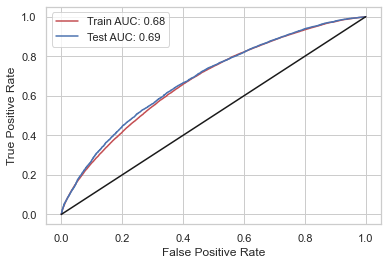

In [262]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_preds)
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_preds)


thresh = 0.5

auc_train = roc_auc_score(y_train, y_train_preds)
auc_test = roc_auc_score(y_test, y_test_preds)

print('Train AUC:%.3f'%auc_train)
print('Test AUC:%.3f'%auc_test)

print('Train accuracy:%.3f'%calc_accuracy(y_train, y_train_preds, thresh))
print('Test accuracy:%.3f'%calc_accuracy(y_test, y_test_preds, thresh))

print('Train recall:%.3f'%calc_recall(y_train, y_train_preds, thresh))
print('Test recall:%.3f'%calc_recall(y_test, y_test_preds, thresh))

print('Train precision:%.3f'%calc_precision(y_train, y_train_preds, thresh))
print('Test precision:%.3f'%calc_precision(y_test, y_test_preds, thresh))

plt.plot(fpr_train, tpr_train,'r-', label = 'Train AUC: %.2f'%auc_train)
plt.plot(fpr_test, tpr_test,'b-',label = 'Test AUC: %.2f'%auc_test)
plt.plot([0,1],[0,1],'-k')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

Feature: 0, Score: -0.14189
Feature: 1, Score: 0.13782
Feature: 2, Score: 0.06893
Feature: 3, Score: 0.09262
Feature: 4, Score: 0.12718
Feature: 5, Score: 0.02110
Feature: 6, Score: 0.07883
Feature: 7, Score: 0.13439
Feature: 8, Score: 0.10940
Feature: 9, Score: 0.22671
Feature: 10, Score: 0.03832
Feature: 11, Score: -0.04088
Feature: 12, Score: 0.41417
Feature: 13, Score: 0.05612
Feature: 14, Score: -0.21269
Feature: 15, Score: 0.04293
Feature: 16, Score: 0.07094
Feature: 17, Score: 0.08253
Feature: 18, Score: -0.00676
Feature: 19, Score: -0.00509
Feature: 20, Score: -0.07217
Feature: 21, Score: -0.01496
Feature: 22, Score: 0.00000
Feature: 23, Score: 0.00000
Feature: 24, Score: 0.00000
Feature: 25, Score: 0.16787
Feature: 26, Score: 0.02518
Feature: 27, Score: -0.08892
Feature: 28, Score: 0.05635
Feature: 29, Score: 0.35854
Feature: 30, Score: -0.32575
Feature: 31, Score: 0.05574
Feature: 32, Score: 0.05040
Feature: 33, Score: -0.10592
Feature: 34, Score: 0.03557
Feature: 35, Score: 

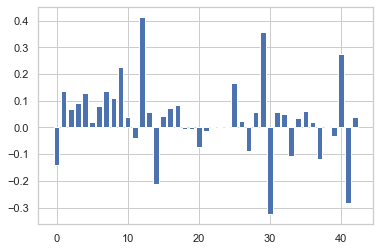

In [263]:
from matplotlib import pyplot

# get importance
importance = model.coef_[0]
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

In [265]:
print(features.columns[12])
print(features.columns[29])

neoplasms
ADM_OBSERVATION


**365 DAYS-READMISSION result**: in this task's result we can see how the feature "neoplasm" has the highest importance prediction. It is followed by the feature of admissions to the hospital for observation. So we could say that patients diagnosed diagnosed in the category "neoplasm" and patients admitted for observation purposes are more likely to be readmitted to the hospital after 365 days from discharge.

## Conclusions for Hospital Readmission

We saw how the probability of readmission to the hospital after discharge changes if we consider different period of time. But most important, we saw that in all of the three time interval considered (30, 90, 365 days after discharge) patients diagnosed in category "neoplasm" has always an high probability to be readmitted, expecially in the 65-days.hasattr

With this kinf of insights it is possible to plan and better manage admissions and hospital stays avoiding crowds and consequently the possibility of getting infections on the hospital. 